<a href="https://colab.research.google.com/github/boxfather78/MaV/blob/main/MaV_Summative_Assessment_0_5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


# <font color='Orange'> Modelling & Visualisation - Summative Assessment </font> 

---
This Colab workbook is split into 6 parts as follows:
- **Part 1**: imports and cleans data alongside preliminary data exploration
- **Part 2**: further exploratory data analysis and feature development
- **Part 3**: data pre-processing and correlation analysis
- **Part 4**: Creation of a series of analytical models to classify whether a card transaction is potentially fraudulent, alongside analysis of the benefits of each type of model
- **Part 5**:  An evaluation of the outcomes for each model using the test (and if applicable) validation datasets, and the creation of a table to store accuracy metrics
- **Part 6**: Illustrations showing the analytical outputs in an engaging manner.

[The GitHub repository can be found here:](https://github.com/boxfather78/MaV)

# <font color='Orange'> 1: Data Import, initial EDA and cleansing </font>

### 1.1: Import code libraries and CSV
Pandas and Numpy data libraries support reading in and wrangling datasets. Import dataframe formatter for easier viewing. 
Pick up transaction dataset and read into Pandas dataframe; sort by Transaction ID. [see pipeline preprocessing](https://scikit-learn.org/stable/modules/preprocessing.html)

In [89]:
import pandas as pd
import numpy as np

from google.colab import data_table
data_table.enable_dataframe_formatter()

df1 = pd.read_csv('https://raw.githubusercontent.com/boxfather78/MaV/main/CreditCardDataFinal.csv')
print(df1.shape)
df1.sort_values(["Transaction ID"], ascending=True).head()

(100000, 16)


,Transaction ID,Date,Day of Week,Time,Type of Card,Entry Mode,Amount,Type of Transaction,Merchant Group,Country of Transaction,Shipping Address,Country of Residence,Gender,Age,Bank,Fraud
25167,#2546 884,13-Oct-20,Tuesday,23,MasterCard,CVC,£17,Online,Restaurant,United Kingdom,Russia,United Kingdom,F,60.5,Barclays,0
74516,#2546 895,14-Oct-20,Wednesday,21,Visa,CVC,£28,Online,Gaming,United Kingdom,United Kingdom,United Kingdom,M,49.7,RBS,0
57940,#2546 903,13-Oct-20,Tuesday,19,Visa,CVC,£8,Online,Subscription,United Kingdom,United Kingdom,United Kingdom,M,46.2,Barclays,0
9776,#2546 906,14-Oct-20,Wednesday,9,MasterCard,PIN,£186,ATM,Entertainment,United Kingdom,United Kingdom,United Kingdom,F,51.3,Barclays,0
52568,#2546 920,13-Oct-20,Tuesday,22,Visa,CVC,£86,Online,Children,United Kingdom,United Kingdom,United Kingdom,F,59.6,Monzo,0


### 1.2: Split dataset
Split dataset into test/train datasets, saving copies of each. This should be done before significant Exploratory Data Analysis or pre-processing, to avoid data (and therefore knowledge) from the test cell leaking into EDA and pre-processing, potentially biasing analysis and cleansing steps taken (citation).

In [90]:
# Split dataset into predictor/target datasets.
from sklearn.model_selection import train_test_split
x = df1.drop(["Fraud"], axis=1)
print("Feature Dataset contains:", x.columns)
y = pd.DataFrame(df1["Fraud"])
print("Target Dataset contains:", y.columns)

# Create model training and test splits. As we have class imbalance in the model, we will stratify samples.
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state=42, stratify=y)
print("x-train:", x_train.shape)
print("y-train:", y_train.shape)
print("x-test:", x_test.shape)
print("y-test:", y_test.shape)

# Merge together training, test and validation datasets to validate stratification.
df1_train = pd.concat([x_train, y_train], axis=1)
print("df1_train:",df1_train.shape)
df1_test = pd.concat([x_test, y_test], axis=1)
print("df1_test:",df1_test.shape,"\n")

fraud_rate_train = pd.crosstab(index=df1_train["Fraud"], columns="Percent", values=df1_train.index, aggfunc='count', normalize='columns').round(4)*100
fraud_rate_test = pd.crosstab(index=df1_test["Fraud"], columns="Percent", values=df1_test.index, aggfunc='count', normalize='columns').round(4)*100

print("Train Fraud Rate \n", fraud_rate_train, "\n Test Fraud Rate \n", fraud_rate_test)

Feature Dataset contains: Index(['Transaction ID', 'Date', 'Day of Week', 'Time', 'Type of Card',
       'Entry Mode', 'Amount', 'Type of Transaction', 'Merchant Group',
       'Country of Transaction', 'Shipping Address', 'Country of Residence',
       'Gender', 'Age', 'Bank'],
      dtype='object')
Target Dataset contains: Index(['Fraud'], dtype='object')
x-train: (80000, 15)
y-train: (80000, 1)
x-test: (20000, 15)
y-test: (20000, 1)
df1_train: (80000, 16)
df1_test: (20000, 16) 

Train Fraud Rate 
 col_0  Percent
Fraud         
0         92.8
1          7.2 
 Test Fraud Rate 
 col_0  Percent
Fraud         
0         92.8
1          7.2


### 1.3: Profile Report
Install latest version of pandas profiling; import Profile Report and create a report to explore the dataset.

In [ ]:
# Install latest version of Pandas Profiling
!pip install https://github.com/ydataai/pandas-profiling/archive/master.zip

from pandas_profiling import ProfileReport

# Create profile report, save and view
prof = ProfileReport(df1_train)
prof.to_file(output_file='output.html')
prof

  Using cached https://github.com/ydataai/pandas-profiling/archive/master.zip


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

### 1.4: Check for DUPLICATES
From the profile report, we can see there are duplicates in the Transaction ID variable, which we might have considered a primary key. There are no full duplicates. Let's look at the Txn ID duplicates to validate treatment.

In [ ]:
# Add column to validate full column-wise duplication and another column for Transaction ID duplicates
df1_train['Full_duplicate'] = df1_train.duplicated(keep='first')
df1_train['TxnID_duplicate'] = df1_train["Transaction ID"].duplicated(keep='first')

# Create dataframe of duplicates and count Txn IDs
df1_full_dupe = df1_train[(df1_train['Full_duplicate'] == True)]
df1_dupe = df1_train[(df1_train['TxnID_duplicate'] == True)]
print("There are", len(df1_full_dupe), " full duplicates across the file.") # 0 duplicates in file
print("There are", len(df1_dupe), "duplicates in the Transaction ID column") # 2,773 duplicates by Transaction ID in file

There are 0  full duplicates across the file.
There are 2773 duplicates in the Transaction ID column


1.4.1: Explore the Transaction ID duplicates

In [ ]:
# Create list of Transaction ID duplicates
dupe_list = df1_dupe["Transaction ID"].tolist()

# Create dataframe of first 5 duplicate Txn IDs and the most frequently occurring Txn ID as shown by profile report, then view all matching records
df1_dupesamp = df1_train[df1_train["Transaction ID"].isin(dupe_list[0:4])]
df2_dupesamp = df1_train[df1_train["Transaction ID"] == "#2617 708"]
df3_dupesamp = df1_dupesamp.append(df2_dupesamp).sort_values(["Transaction ID"], ascending=True) 
df3_dupesamp

,Transaction ID,Date,Day of Week,Time,Type of Card,Entry Mode,Amount,Type of Transaction,Merchant Group,Country of Transaction,Shipping Address,Country of Residence,Gender,Age,Bank,Fraud,Full_duplicate,TxnID_duplicate
40884,#2617 708,13-Oct-20,Tuesday,13,Visa,CVC,£10,Online,Subscription,United Kingdom,United Kingdom,United Kingdom,M,53.9,Halifax,0,False,False
44182,#2617 708,13-Oct-20,Tuesday,18,MasterCard,CVC,£22,Online,Services,Russia,Russia,Russia,M,56.4,Halifax,0,False,True
31680,#2617 708,13-Oct-20,Tuesday,23,MasterCard,CVC,£183,Online,Subscription,United Kingdom,United Kingdom,United Kingdom,F,48.1,Halifax,0,False,True
34877,#2617 708,13-Oct-20,Tuesday,22,MasterCard,CVC,£206,Online,Food,United Kingdom,China,United Kingdom,M,45.6,Lloyds,0,False,True
43633,#2775 342,13-Oct-20,Tuesday,11,MasterCard,PIN,£30,ATM,Restaurant,USA,USA,USA,F,43.4,Barlcays,0,False,False
52077,#2775 342,13-Oct-20,Tuesday,10,MasterCard,CVC,£27,Online,Services,Russia,Russia,Russia,F,52.3,Metro,0,False,True
93561,#3365 909,14-Oct-20,Wednesday,19,MasterCard,CVC,£76,Online,Gaming,United Kingdom,United Kingdom,United Kingdom,M,65.6,HSBC,0,False,False
77610,#3365 909,14-Oct-20,Wednesday,18,Visa,CVC,£22,Online,Subscription,United Kingdom,United Kingdom,United Kingdom,F,56.1,Monzo,0,False,True
20344,#3457 714,13-Oct-20,Tuesday,19,Visa,Tap,£23,POS,Electronics,United Kingdom,United Kingdom,United Kingdom,F,46.4,Metro,0,False,False
42290,#3457 714,14-Oct-20,Wednesday,12,Visa,CVC,£353,Online,Children,United Kingdom,United Kingdom,United Kingdom,M,44.2,Halifax,0,False,True


1.4.2: Confirmation that duplicate Transaction IDs don't look like duplicate transactions, but could duplicates point to fraud?

In [ ]:
# Is a duplicate transaction ID an indicator of Fraud?
fraud_dupe = pd.crosstab(index=df1_dupe["Fraud"], columns="Percent", normalize = "columns").round(4)*100
fraud_rate = pd.crosstab(index=df1_train["Fraud"], columns="Percent", normalize = "columns").round(4)*100
print(fraud_dupe, "\n", fraud_rate)
# Positive fraud rate of duplicates is 7.9% vs. full file rate of 7.2%, so might be worth creating a marker against all duplicated Txn_IDs.

col_0  Percent
Fraud         
0         92.1
1          7.9 
 col_0  Percent
Fraud         
0         92.8
1          7.2


1.4.3: Create new variable indicating that Txn ID is a duplicate

In [ ]:
# Create duplicate Transaction ID indicator
df1_train["TxnID_Dup"] = np.where(df1_train["Transaction ID"].isin(dupe_list), 1, 0)

# Drop Full_Duplicate and Txn_ID Duplicate variables from df1_train
df1_train.drop(["Full_duplicate","TxnID_duplicate"], axis=1, inplace=True)
df1_train.head()

,Transaction ID,Date,Day of Week,Time,Type of Card,Entry Mode,Amount,Type of Transaction,Merchant Group,Country of Transaction,Shipping Address,Country of Residence,Gender,Age,Bank,Fraud,TxnID_Dup
74551,#3175 659,13-Oct-20,Tuesday,7,Visa,PIN,£69,ATM,Children,Russia,Russia,United Kingdom,M,40.6,Lloyds,0,0
63789,#2913 418,13-Oct-20,Tuesday,20,MasterCard,PIN,£295,POS,Fashion,United Kingdom,United Kingdom,United Kingdom,F,38.7,Halifax,0,0
73905,#3370 828,14-Oct-20,Wednesday,18,MasterCard,Tap,£9,POS,Restaurant,United Kingdom,United Kingdom,United Kingdom,M,54.0,HSBC,0,0
27944,#3639 312,13-Oct-20,Tuesday,7,Visa,Tap,£7,POS,Products,United Kingdom,United Kingdom,United Kingdom,F,42.0,RBS,0,0
49155,#3594 542,13-Oct-20,Tuesday,13,MasterCard,PIN,£356,ATM,Products,United Kingdom,United Kingdom,United Kingdom,M,28.0,Barlcays,0,0


### 1.5: Check for COMPLETENESS
 Check for completeness and missing values

In [ ]:
# We can see missing values in the dataset from the profile report. This is validated here.
print("There are",sum(df1_train.isnull().any(axis=1)),"rows with at least one missing value")
# Validate which columns have missing values
print(df1_train.isna().sum());

There are 16 rows with at least one missing value
Transaction ID            0
Date                      0
Day of Week               0
Time                      0
Type of Card              0
Entry Mode                0
Amount                    5
Type of Transaction       0
Merchant Group            7
Country of Transaction    0
Shipping Address          2
Country of Residence      0
Gender                    3
Age                       0
Bank                      0
Fraud                     0
TxnID_Dup                 0
dtype: int64


In [ ]:
# Create dataframe of missing values then check fraud rates across dataset
null_data = df1_train[df1_train.isnull().any(axis=1)]
fraud_null = pd.crosstab(index=null_data["Fraud"], columns="Percent", normalize = "columns").round(4)*100
print(fraud_null)

# Fraud rate is 12.5% where a value is missing, versus 7.2% on full file, meaning transaction is more likely to be fraud if at least one value is missing.

col_0  Percent
Fraud         
0         87.5
1         12.5


In [ ]:
# We can also look at Fraud rate against missing values in specific columns
null_data_amount = df1_train[df1_train["Amount"].isnull()]
fraud_null_amount = pd.crosstab(index=null_data_amount["Fraud"], columns="Percent", normalize = "columns").round(4)*100
null_data_merchant = df1_train[df1_train["Merchant Group"].isnull()]
fraud_null_merchant = pd.crosstab(index=null_data_merchant["Fraud"], columns="Percent", normalize = "columns").round(4)*100
null_data_shipping = df1_train[df1_train["Shipping Address"].isnull()]
fraud_null_shipping = pd.crosstab(index=null_data_shipping["Fraud"], columns="Percent", normalize = "columns").round(4)*100
null_data_gender = df1_train[df1_train["Gender"].isnull()]
fraud_null_gender = pd.crosstab(index=null_data_gender["Fraud"], columns="Percent", normalize = "columns").round(4)*100
print("Amount\n", fraud_null_amount,"\n\n", "Merchant Group\n", fraud_null_merchant,"\n\n", "Shipping Address\n",
      fraud_null_shipping,"\n\n", "Gender\n", fraud_null_gender)

# Fraud is present across 40% of cases where Amount is null. 

Amount
 col_0  Percent
Fraud         
0         60.0
1         40.0 

 Merchant Group
 col_0  Percent
Fraud         
0        100.0 

 Shipping Address
 col_0  Percent
Fraud         
0        100.0 

 Gender
 col_0  Percent
Fraud         
0        100.0


1.5.1: Null value treatments 

* Taking an average value could be one option for in-fill of the missing values for Amount, but this could skew the outcome, since 40% are fraudulent. Zero is another option, as is removal. We'll come back to this after converting the variable to a numeric and running descriptive statistics.
* It's not possible to impute Merchant Group or Shipping Address accurately by using other information. Since this is a categorical variable, we could just label these as unknown, but as the volume of missing is low we will remove.
* Missing gender cannot be imputed accurately without more information such as customer name and missing volume is low so we will drop these rows.

In [ ]:
# Deal with nulls as shown above - remove rows with missing Genders, Merchant Groups and Shipping Address
df1_train.dropna(how='any', subset=['Gender','Merchant Group','Shipping Address'], inplace=True)

print(df1_train.shape) # 11 records removed
df1_train.head()

(79989, 17)


,Transaction ID,Date,Day of Week,Time,Type of Card,Entry Mode,Amount,Type of Transaction,Merchant Group,Country of Transaction,Shipping Address,Country of Residence,Gender,Age,Bank,Fraud,TxnID_Dup
74551,#3175 659,13-Oct-20,Tuesday,7,Visa,PIN,£69,ATM,Children,Russia,Russia,United Kingdom,M,40.6,Lloyds,0,0
63789,#2913 418,13-Oct-20,Tuesday,20,MasterCard,PIN,£295,POS,Fashion,United Kingdom,United Kingdom,United Kingdom,F,38.7,Halifax,0,0
73905,#3370 828,14-Oct-20,Wednesday,18,MasterCard,Tap,£9,POS,Restaurant,United Kingdom,United Kingdom,United Kingdom,M,54.0,HSBC,0,0
27944,#3639 312,13-Oct-20,Tuesday,7,Visa,Tap,£7,POS,Products,United Kingdom,United Kingdom,United Kingdom,F,42.0,RBS,0,0
49155,#3594 542,13-Oct-20,Tuesday,13,MasterCard,PIN,£356,ATM,Products,United Kingdom,United Kingdom,United Kingdom,M,28.0,Barlcays,0,0


### 1.6: Check for CONFORMITY
Based on review of data types, recommended actions are:
* Convert 'Date' to DateTime variable, to support a potential wider dataset in future and/or time series analysis.
* Convert 'Day of Week', 'Type of Card', 'Entry Mode', 'Type of Transaction','Merchant Group','Country of Transaction','Shipping Address','Country of Residence','Bank' into Category variables to make variable contents clear.
* 'Amount' should be a float variable, but here it is rounded to a whole number as an object. To convert, we will first remove currency symbol, as all are in GBP.
* While we could change 'Time' to a DateTime variable as well, It is simple enough to interpret as an integer, so I will leave as is.

In [ ]:
print(df1_train.dtypes)

Transaction ID             object
Date                       object
Day of Week                object
Time                        int64
Type of Card               object
Entry Mode                 object
Amount                     object
Type of Transaction        object
Merchant Group             object
Country of Transaction     object
Shipping Address           object
Country of Residence       object
Gender                     object
Age                       float64
Bank                       object
Fraud                       int64
TxnID_Dup                   int64
dtype: object


In [ ]:
# Replace £ signs and convert Amount to a float
df1_train["Amount"] = df1_train["Amount"].replace('£', '', regex=True)
df1_train = df1_train.astype({"Amount": 'float'})
# Convert Object variables into Categorical
df1_train = df1_train.astype({"Day of Week": 'category',"Type of Card": 'category',"Entry Mode":'category',"Type of Transaction":'category',
                  "Merchant Group":'category',"Country of Transaction":'category',"Shipping Address":'category',
                  "Country of Residence":'category',"Bank":'category',"Gender":'category'})

# Convert Date into Datetime variable
df1_train["Date"] = pd.to_datetime(df1_train["Date"])
print(df1_train.dtypes)

Transaction ID                    object
Date                      datetime64[ns]
Day of Week                     category
Time                               int64
Type of Card                    category
Entry Mode                      category
Amount                           float64
Type of Transaction             category
Merchant Group                  category
Country of Transaction          category
Shipping Address                category
Country of Residence            category
Gender                          category
Age                              float64
Bank                            category
Fraud                              int64
TxnID_Dup                          int64
dtype: object


In [ ]:
# Validate changes by exploring start of file
df1_train.head()

,Transaction ID,Date,Day of Week,Time,Type of Card,Entry Mode,Amount,Type of Transaction,Merchant Group,Country of Transaction,Shipping Address,Country of Residence,Gender,Age,Bank,Fraud,TxnID_Dup
74551,#3175 659,2020-10-13,Tuesday,7,Visa,PIN,69.0,ATM,Children,Russia,Russia,United Kingdom,M,40.6,Lloyds,0,0
63789,#2913 418,2020-10-13,Tuesday,20,MasterCard,PIN,295.0,POS,Fashion,United Kingdom,United Kingdom,United Kingdom,F,38.7,Halifax,0,0
73905,#3370 828,2020-10-14,Wednesday,18,MasterCard,Tap,9.0,POS,Restaurant,United Kingdom,United Kingdom,United Kingdom,M,54.0,HSBC,0,0
27944,#3639 312,2020-10-13,Tuesday,7,Visa,Tap,7.0,POS,Products,United Kingdom,United Kingdom,United Kingdom,F,42.0,RBS,0,0
49155,#3594 542,2020-10-13,Tuesday,13,MasterCard,PIN,356.0,ATM,Products,United Kingdom,United Kingdom,United Kingdom,M,28.0,Barlcays,0,0


### 1.7: Check for INTEGRITY
Checking for erroneous values



In [ ]:
# Rerun profile report on updated dataset
prof2 = ProfileReport(df1_train)
prof2.to_file(output_file='output2.html')
prof2

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/scipy/stats/stats.py:4812: RuntimeWarning: overflow encountered in long_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

1.7.1 Data Integrity Observations:
* Date has some values that fall outside 13/14th October - validate and possibly remove
* Time has 25 distinct values, yet there are only 24 hours in the day - validate whether we should merge 0 and 24.
* Amount has a minimum value of 5, meaning we shouldn't lose information by imputing NaNs as 0.
* Age contains values under 18 - under 18s can't hold credit cards in the UK - analysis needed on these records (citation)
* Day of Week contains errors - we should only have Tuesday and Wednesday - validate and correct
* Bank contains possible type 'Barlcays' - validate and correct.

In [ ]:
# VALIDATIONS
# Date - check any issue with removing 2 records from 15/16th October to maintain date integrity
date_check = df1_train.groupby(['Date', 'Fraud'])['Fraud'].count().rename("count")
print("Fraud rate by date: \n", date_check,"\n") 

# Time - view records to understand treatment for 1 value of 24
datetime_check = df1_train[df1_train["Time"] == 24]
print("Records with Time of 24: \n", datetime_check, '\n') # Case is fraudulent, suggest relabelling as 0 to indicate midnight.

# Age - create variable for U18s to view if the Fraud profile is different or whether country of residence might permit u18 to hold credit card
df1_train["Age_lt18"] = np.where(df1_train["Age"] < 18, 'Yes', 'No')
age_check = df1_train.groupby(['Age_lt18', 'Fraud'])['Fraud'].count().rename("count")
age_loc_check = df1_train.groupby(['Country of Residence', 'Age_lt18'])['Fraud'].count().rename("count")
print("Fraud rate by Age of <18: \n", age_check / age_check.groupby(level=0).sum()*100, '\n') # Marginally higher rates of fraud amongst under 18s
print("Country of Residence by Age of <18: \n", age_loc_check, '\n') # Most u18s are indeed in UK 

# Bank - check Fraud rate of 'Barlcays' vs. other banks
bank_check = df1_train.groupby(['Bank', 'Fraud'])['Fraud'].count().rename("count")
print("Fraud rate by bank name: \n", bank_check / bank_check.groupby(level=0).sum()*100,'\n') # A lower rate of Fraud, but clearly a typo that needs correcting

# Day of Week - create unique list of days then create dataframe of values with DoW = Thursday or Friday
dow_list = df1_train["Day of Week"].tolist()
dow_unique = pd.unique(dow_list)
print("Unique list of days:", dow_unique,"\n")
dow_check = df1_train[df1_train["Day of Week"].isin(dow_unique[2:])]
print("All records with Day of week = Thursday or Friday:")
dow_check

Fraud rate by date: 
 Date        Fraud
2020-10-13  0        36853
            1         2994
2020-10-14  0        37380
            1         2760
2020-10-15  1            1
2020-10-16  1            1
Name: count, dtype: int64 

Records with Time of 24: 
       Transaction ID       Date Day of Week  Time Type of Card Entry Mode  \
32446      #2547 017 2020-10-14   Wednesday    24   MasterCard        CVC   

       Amount Type of Transaction Merchant Group Country of Transaction  \
32446   371.0              Online    Electronics                  India   

      Shipping Address Country of Residence Gender   Age      Bank  Fraud  \
32446            India                India      M  57.7  Barclays      1   

       TxnID_Dup  
32446          1   

Fraud rate by Age of <18: 
 Age_lt18  Fraud
No        0        92.804458
          1         7.195542
Yes       0        92.537313
          1         7.462687
Name: count, dtype: float64 

Country of Residence by Age of <18: 
 Country of Res

,Transaction ID,Date,Day of Week,Time,Type of Card,Entry Mode,Amount,Type of Transaction,Merchant Group,Country of Transaction,Shipping Address,Country of Residence,Gender,Age,Bank,Fraud,TxnID_Dup,Age_lt18
75994,#3271 352,2020-10-13,Thursday,16,Visa,Tap,7.0,POS,Products,Russia,Russia,United Kingdom,F,61.1,Metro,1,0,No
96801,#2686 124,2020-10-13,Friday,9,Visa,CVC,21.0,Online,Fashion,United Kingdom,India,United Kingdom,M,39.6,HSBC,0,0,No
20296,#3066 613,2020-10-13,Thursday,10,Visa,PIN,169.0,POS,Fashion,United Kingdom,United Kingdom,United Kingdom,M,48.6,Barclays,0,1,No
48256,#2872 483,2020-10-14,Friday,11,MasterCard,CVC,215.0,Online,Entertainment,USA,USA,USA,F,38.7,Barclays,0,0,No
64255,#2548 251,2020-10-15,Thursday,8,Visa,PIN,243.0,POS,Gaming,United Kingdom,United Kingdom,United Kingdom,M,38.9,Barclays,1,1,No
37546,#2870 052,2020-10-13,Thursday,13,MasterCard,Tap,28.0,POS,Subscription,Russia,Russia,Russia,F,57.6,Monzo,0,0,No
68093,#2983 032,2020-10-14,Friday,15,Visa,CVC,16.0,Online,Electronics,United Kingdom,United Kingdom,United Kingdom,M,49.7,Halifax,0,1,No
64778,#3328 717,2020-10-14,Thursday,16,MasterCard,Tap,18.0,POS,Services,United Kingdom,United Kingdom,United Kingdom,M,41.5,Barclays,0,0,No
10483,#2982 416,2020-10-13,Thursday,7,Visa,PIN,294.0,ATM,Gaming,United Kingdom,United Kingdom,United Kingdom,M,38.6,Barlcays,0,0,No
30844,#2895 855,2020-10-13,Friday,7,Visa,CVC,25.0,Online,Fashion,United Kingdom,United Kingdom,United Kingdom,M,33.4,Monzo,0,0,No


1.7.2 Data Integrity Actions:
* Remove Dates falling outside 13/14th October to maintain data integrity.
* Recode value of 24 to 0, to reflect time of midnight.
* Fill Nans in Amount column with 0, as this is a possible input that hasn't been picked up. Taking an average value doesn't feel right, given many NaN values were fraudulent.
* Age contains values under 18 - suggested action is to flag this to stakeholders who may want to put rules in place on data, but we should leave in data for now to reflect expected likely input data, allowing model to cater for U18s.
* Code Day of Week to the correct date, removing instances of Thursday and Friday.
* Recode 'Barlcays' with 'Barclays' as this is an obvious error.

In [ ]:
# DATA CLEANSE - carry out changes as suggested in 1.7.1

# Amount - recode our 6 NaNs to 0 and check
df1_train["Amount"] = df1_train["Amount"].replace(np.nan, 0, regex=True)
print("Show new Min value of Amount variable \n", df1_train["Amount"].describe(),"\n") # Min value is now 0.

# Date - 15/16th Oct are both marked as Fraudulent, yet we can't impute a new date. Remove to maintain integrity of dataset which is only supposed to be 13/14th Oct transactions.
df1_train = df1_train.drop(df1_train[(df1_train["Date"] == "2020-10-15") | (df1_train["Date"] ==  "2020-10-16")].index)
date_check2 = df1_train.groupby(['Date','Day of Week'])['Date'].count().rename("count")
print("No more dates of 15/16th in Date column \n", date_check2, "\n") 
print("Two records removed: \n", len(df1_train),"\n") # 2 records removed; only 13/14th Oct remain.

# Time - replace singlevalue of 24 with 0
df1_train["Time"] = df1_train["Time"].replace(24, 0, regex=True)
new_time = df1_train.groupby(['Time'])['Time'].count().rename("count")
print("No more 24 in Time variable \n", new_time,"\n")

# Age - No treatment required, but we will remove the variable that was created for validation
df1_train.drop(["Age_lt18"], axis=1, inplace=True)

# Day of Week - Replace incorrect Days of Week to align with Date.
df1_train["Day of Week"] = np.where(df1_train["Date"] == "2020-10-13", "Tuesday", "Wednesday")
date_check3 = df1_train.groupby(['Date','Day of Week'])['Date'].count().rename("count")
print("No more Thursday/Friday in Day of Week column: \n", date_check3,"\n") # Only Tues/Wed now present in data, aligned to correct dates.

# Bank - Amend 'Barlcays' to 'Barclays'
df1_train["Bank"] = df1_train["Bank"].replace('Barlcays', 'Barclays', regex=True)
bank_check = df1_train.groupby(["Bank"])["Bank"].count().rename("count")
print("No more 'Barlcays' in data: \n", bank_check,"\n") # Barlcays no longer in data.

Show new Min value of Amount variable 
 count    79989.000000
mean       112.778007
std        123.634020
min          0.000000
25%         17.000000
50%         30.000000
75%        209.000000
max        400.000000
Name: Amount, dtype: float64 

No more dates of 15/16th in Date column 
 Date        Day of Week
2020-10-13  Friday             6
            Thursday           4
            Tuesday        39837
            Wednesday          0
2020-10-14  Friday             4
            Thursday           2
            Tuesday            0
            Wednesday      40134
Name: count, dtype: int64 

Two records removed: 
 79987 

No more 24 in Time variable 
 Time
0      407
1      389
2      422
3      432
4      390
5      377
6      402
7     4538
8     4540
9     4452
10    4513
11    4619
12    4593
13    4661
14    4589
15    4604
16    4622
17    4532
18    4470
19    4432
20    4404
21    4464
22    4531
23    4604
Name: count, dtype: int64 

No more Thursday/Friday in Day of Wee

### 1.8: Check for OUTLIERS




In [ ]:
# Descriptives for numeric variables
print(df1_train.describe())

               Time        Amount           Age         Fraud     TxnID_Dup
count  79987.000000  79987.000000  79987.000000  79987.000000  79987.000000
mean      14.559316    112.774751     44.997558      0.071937      0.068649
std        5.302701    123.633851      9.954264      0.258385      0.252857
min        0.000000      0.000000     15.000000      0.000000      0.000000
25%       10.000000     17.000000     38.200000      0.000000      0.000000
50%       15.000000     30.000000     44.900000      0.000000      0.000000
75%       19.000000    209.000000     51.700000      0.000000      0.000000
max       23.000000    400.000000     86.100000      1.000000      1.000000


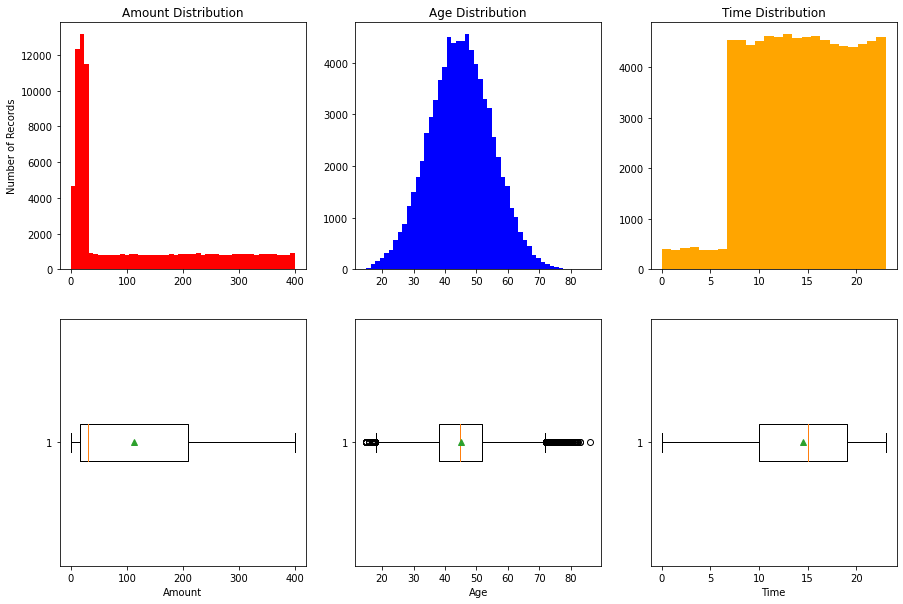

In [ ]:
# OUTLIERS - Look at histograms for Time, Amount and Age.
import matplotlib.pyplot as plt #Import matplotlib to show some variable comparisons
%matplotlib inline

# Define series
x = df1_train["Amount"]
y = df1_train["Age"]
z = df1_train["Time"]

# Define canvas size and layout
fig, axs = plt.subplots(2, 3, figsize=(15,10))

# Top level for Histograms
axs[0,0].hist(x,bins=50,histtype='bar',color='red')
axs[0,0].set(title='Amount Distribution', ylabel='Number of Records')
axs[0,1].hist(y,bins=50,histtype='bar',color='blue')
axs[0,1].set(title='Age Distribution')
axs[0,2].hist(z,bins=24,histtype='bar',color='orange') # 24 bins to support hours in day
axs[0,2].set(title='Time Distribution')

# Bottom level for box-plots
axs[1,0].boxplot(x,showmeans=True, vert=False, notch=False)
axs[1,0].set(xlabel='Amount')
axs[1,1].boxplot(y,showmeans=True, vert=False, notch=False)
axs[1,1].set(xlabel='Age')
axs[1,2].boxplot(z,showmeans=True, vert=False, notch=False)
axs[1,2].set(xlabel='Time')

plt.show()

1.8.1: Numeric variable distribution/outlier observations:

Amount is right-skewed, which makes some sense,though this skews the mean considerably to £112 vs. a median of £30. Age has a normal distribution with some outliers, but these are not of concern, beyond what has already been discussed re: legal credit-card ownership in UK.Time is left-skewed, due to lower volume of transactions during night hours. 

### 1.9: Save cleansed train dataset for next step.

In [ ]:
# Validate columns in df1 dataset
print(df1_train.columns)
# Save dataset while keeping original columns
df1_train.to_csv('CreditCardDataFinalClean.csv', mode='w', index=True)

# Download dataset and upload to Github profile. This can then be used to continute script from step 2, rather than run step 1 each time.
from google.colab import files
files.download('CreditCardDataFinalClean.csv')

Index(['Transaction ID', 'Date', 'Day of Week', 'Time', 'Type of Card',
       'Entry Mode', 'Amount', 'Type of Transaction', 'Merchant Group',
       'Country of Transaction', 'Shipping Address', 'Country of Residence',
       'Gender', 'Age', 'Bank', 'Fraud', 'TxnID_Dup'],
      dtype='object')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# <font color='Orange'> 2: Further EDA and Feature Variable creation</font>

### 2.1: Re-run profile report
This time on our cleansed data

In [ ]:
!pip install https://github.com/ydataai/pandas-profiling/archive/master.zip
import numpy as np
import pandas as pd
from pandas_profiling import ProfileReport
import matplotlib.pyplot as plt #Import matplotlib to show some variable comparisons
%matplotlib inline

In [ ]:
# Read in cleansed dataset, drop Transaction ID and set index
df2_train = pd.read_csv('https://raw.githubusercontent.com/boxfather78/MaV/main/CreditCardDataFinalClean.csv') # For final version, amend to downloaded version
df2_train.set_index(df2_train.columns[0], drop=True, inplace=True)
df2_train.index.name = None
df2_train = df2_train.drop("Transaction ID", axis=1)
print(df2_train.head())
print(df2_train.dtypes)

# Rerun profile report on updated dataset
prof3 = ProfileReport(df2_train)
prof3.to_file(output_file='output3.html')
prof3

             Date Day of Week  Time Type of Card Entry Mode  Amount  \
74551  2020-10-13     Tuesday     7         Visa        PIN    69.0   
63789  2020-10-13     Tuesday    20   MasterCard        PIN   295.0   
73905  2020-10-14   Wednesday    18   MasterCard        Tap     9.0   
27944  2020-10-13     Tuesday     7         Visa        Tap     7.0   
49155  2020-10-13     Tuesday    13   MasterCard        PIN   356.0   

      Type of Transaction Merchant Group Country of Transaction  \
74551                 ATM       Children                 Russia   
63789                 POS        Fashion         United Kingdom   
73905                 POS     Restaurant         United Kingdom   
27944                 POS       Products         United Kingdom   
49155                 ATM       Products         United Kingdom   

      Shipping Address Country of Residence Gender   Age      Bank  Fraud  \
74551           Russia       United Kingdom      M  40.6    Lloyds      0   
63789   United K

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/scipy/stats/stats.py:4812: RuntimeWarning: overflow encountered in long_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

### 2.2: EDA - Type of Transaction & Entry

The profile report suggests a strong correlation between Amount & Entry Mode and Type of Transaction and Entry Mode. We can explore this first.

Percentage of transactions: Type of Transaction vs. Entry Mode 
 Type of Transaction    ATM  Online    POS
Entry Mode                               
CVC                   0.00    33.5   0.00
PIN                  33.33     0.0  16.70
Tap                   0.00     0.0  16.47 

 Average transaction values: Type of Transactions vs. Entry Mode 
 Type of Transaction     ATM  Online     POS
Entry Mode                                 
CVC                     NaN  112.67     NaN
PIN                  112.74     NaN  207.09
Tap                     NaN     NaN   17.47 


AxesSubplot(0.125,0.125;0.775x0.755) 
 AxesSubplot(0.125,0.125;0.775x0.755)


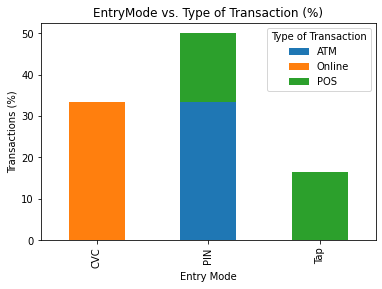

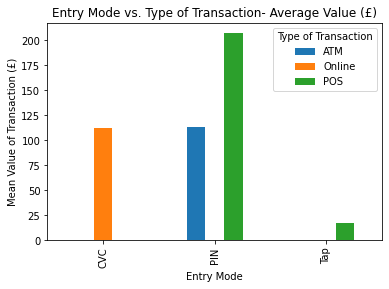

In [ ]:
# Look at Type of Transaction vs. Entry Mode to understand inter-dependencies and average spend values for each
ct1 = pd.crosstab(index=df2_train["Entry Mode"], columns=df2_train["Type of Transaction"], values=df2_train.index, aggfunc='count', normalize=True).round(4)*100
ct2 = pd.crosstab(index=df2_train["Entry Mode"], columns=df2_train["Type of Transaction"], values=df2_train["Amount"], aggfunc='mean').round(2)
print("Percentage of transactions: Type of Transaction vs. Entry Mode \n", ct1, '\n\n',
      "Average transaction values: Type of Transactions vs. Entry Mode \n", ct2, '\n\n')

# First chart shows how each Entry Type is split across Type of Transaction 
bar1 = ct1.plot(
    kind='bar', stacked=True, xlabel='Entry Mode',ylabel='Transactions (%)',title="EntryMode vs. Type of Transaction (%)")

# Second chart shows mean value of transactions for entry mode/type of transaction, showing that tap transaction types are restricted by payment limits
bar2 = ct2.round(2).plot(kind='bar', 
                           xlabel='Entry Mode',ylabel='Mean Value of Transaction (£)',title="Entry Mode vs. Type of Transaction- Average Value (£)")

print(bar1, '\n', bar2);

### 2.3: Create Feature - Type Entry
The strong correlation between Entry Mode and Type of Transaction is due to the fact that only Online transactions are CVC entry mode, and Tap transactions are always at POS (Point of sale). PIN transactions can be done at either ATM or POS. 

We can create one variable to explain both Type of Transaction and Entry Mode by combining the two variables without losing any information. This will avoid any model counting the variables impact twice. The impact on Fraud (seen below) shows that the new variable could be significant.

In [ ]:
# Create new single variable for Entry Mode/Type of Transaction
df2_train["Type Entry"] = df2_train[["Type of Transaction", "Entry Mode"]].apply("-".join, axis=1)

# Create crosstabs to validate output
check_new_var = pd.crosstab(index=df2_train["Type Entry"], columns='Percent', values=df2_train.index, aggfunc='count', normalize=True).round(4)*100
Type_Entry_Fraud = pd.crosstab(index=df2_train["Type Entry"], columns=df2_train["Fraud"], values=df2_train.index, aggfunc='sum', normalize='index').round(4)*100
print("New Type Entry variable: \n", check_new_var,
      "\n\n New Type Entry variable Fraud likelihood: \n", Type_Entry_Fraud)


New Type Entry variable: 
 col_0       Percent
Type Entry         
ATM-PIN       33.33
Online-CVC    33.50
POS-PIN       16.70
POS-Tap       16.47 

 New Type Entry variable Fraud likelihood: 
 Fraud           0      1
Type Entry              
ATM-PIN     95.16   4.84
Online-CVC  90.55   9.45
POS-PIN     97.17   2.83
POS-Tap     88.77  11.23


### 2.4: EDA - Country of Transaction vs. Shipping Address
How indicative of Fraud is a different Country of Transaction and Shipping Address? This information could be very important so we should investigate and potentially create some features.



Shipping Address        China  India  Russia   USA  United Kingdom
Country of Transaction                                            
China                    20.5    0.0     0.0   0.0             0.5
India                     0.0   21.1     0.0   0.0             0.5
Russia                    0.0    0.0    20.2   0.0             0.4
USA                       0.0    0.0     0.0  21.4             0.5
United Kingdom            3.8    3.1     3.9   4.3             0.0


<function matplotlib.pyplot.show>

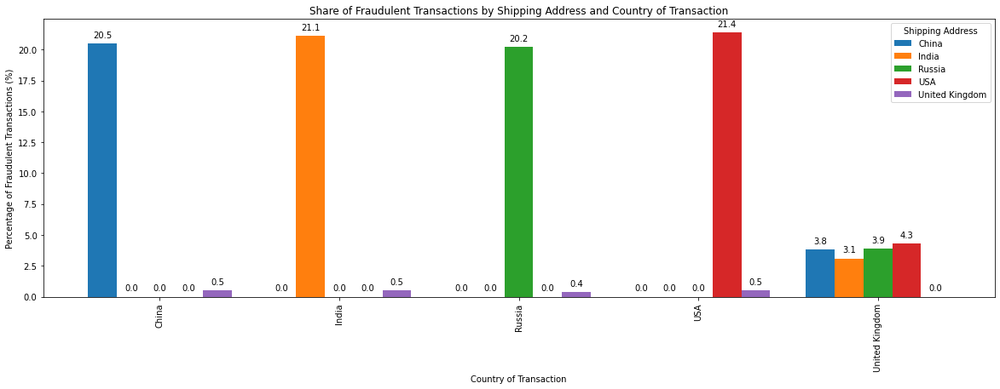

In [ ]:
# Create crosstab showing Fraudulent cases split by Country of Transaction vs. Shipping Address
ct2_42 = round(pd.crosstab(index=df2_train["Country of Transaction"], columns=df2_train["Shipping Address"], values=df2_train["Fraud"], aggfunc='sum', 
                               normalize=True),3)*100
print(ct2_42)
# Use crosstab to create bar chart.
bar2_42 = ct2_42.plot(kind='bar', xlabel='Country of Transaction', ylabel='Percentage of Fraudulent Transactions (%)', 
                              title="Share of Fraudulent Transactions by Shipping Address and Country of Transaction", width=0.8, figsize=(20,6))#.legend(bbox_to_anchor=(1, 1))
# Annotate the chart with values
for p in bar2_42.patches:
    bar2_42.annotate(s=round(p.get_height(), 3),
                xy=(p.get_x()+p.get_width()/2., p.get_height()),
                ha='center',
                va='center',
                xytext=(0, 10),
                textcoords='offset points')
plt.show

### 2.5: Create Features: Country similarities
It looks like around 83% of fraudulent transactions occurs when Shipping Address and Country of Transaction are outside UK, with an additional 15% occuring when Country of Transaction is in the UK, but the goods are shipped abroad. We should create feature variables for this, as well as for Country of Residence since these look like they may be significant in finding fraudulent transactions.

In [ ]:
# Create feature variables for Shipping Address, Country of Transaction and Country of Residence to show where these differ.
df2_train["Ship_Txn_Same"] = np.where(df2_train["Shipping Address"] == df2_train["Country of Transaction"], 1, 0)
df2_train["Ship_Res_Same"] = np.where(df2_train["Shipping Address"] == df2_train["Country of Residence"], 1, 0)
df2_train["Res_Txn_Same"] = np.where(df2_train["Country of Residence"] == df2_train["Country of Transaction"], 1, 0)

# Create filtered dataframe to check output
df2_train_check = df2_train[(df2_train["Ship_Txn_Same"] == 0)]
print(df2_train_check.shape)
print(df2_train_check.dtypes)
df2_train_check.head()

(9618, 20)
Date                       object
Day of Week                object
Time                        int64
Type of Card               object
Entry Mode                 object
Amount                    float64
Type of Transaction        object
Merchant Group             object
Country of Transaction     object
Shipping Address           object
Country of Residence       object
Gender                     object
Age                       float64
Bank                       object
Fraud                       int64
TxnID_Dup                   int64
Type Entry                 object
Ship_Txn_Same               int64
Ship_Res_Same               int64
Res_Txn_Same                int64
dtype: object


,Date,Day of Week,Time,Type of Card,Entry Mode,Amount,Type of Transaction,Merchant Group,Country of Transaction,Shipping Address,Country of Residence,Gender,Age,Bank,Fraud,TxnID_Dup,Type Entry,Ship_Txn_Same,Ship_Res_Same,Res_Txn_Same
55838,2020-10-14,Wednesday,10,Visa,CVC,267.0,Online,Subscription,United Kingdom,USA,United Kingdom,F,37.6,Monzo,0,0,Online-CVC,0,0,1
31067,2020-10-14,Wednesday,10,Visa,PIN,330.0,ATM,Food,United Kingdom,USA,United Kingdom,F,49.8,Barclays,0,0,ATM-PIN,0,0,1
36838,2020-10-13,Tuesday,19,MasterCard,CVC,225.0,Online,Subscription,United Kingdom,India,United Kingdom,F,36.8,Metro,0,0,Online-CVC,0,0,1
37992,2020-10-14,Wednesday,12,Visa,CVC,28.0,Online,Restaurant,United Kingdom,USA,United Kingdom,F,37.5,Barclays,0,0,Online-CVC,0,0,1
77412,2020-10-14,Wednesday,9,MasterCard,PIN,243.0,POS,Restaurant,United Kingdom,USA,United Kingdom,F,44.2,HSBC,0,0,POS-PIN,0,0,1


###2.6: EDA - Merchant Group vs. Fraud
It's worth looking at average value of Fraud to see if it differs by Merchant Group. Below we can see that it's highest on Children and Electronics categories. 

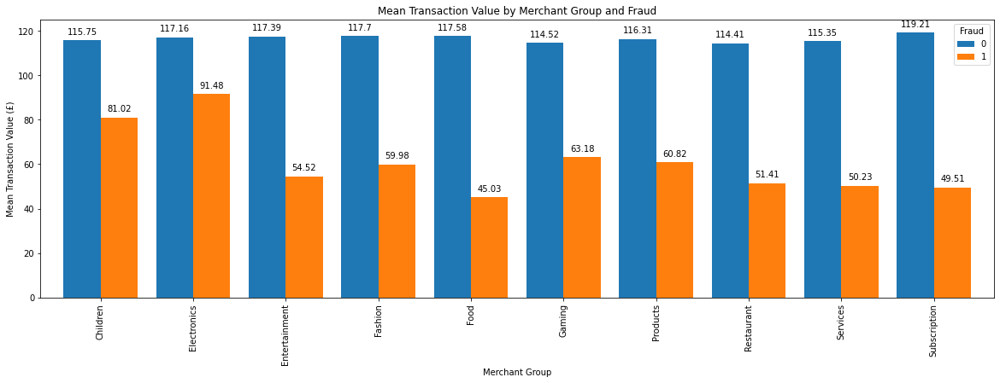

In [ ]:
# Create crosstab
ct2_6 = round(pd.crosstab(index=df2_train["Merchant Group"], columns=df2_train["Fraud"], values=df2_train["Amount"], aggfunc='mean', 
                               normalize=False),2)

# Create bar chart from crosstab
bar2_6 = ct2_6.plot(kind='bar', xlabel='Merchant Group', ylabel='Mean Transaction Value (£)',
                              title="Mean Transaction Value by Merchant Group and Fraud", width=0.8, figsize=(20,6))
# Annotate the chart with values
for p in bar2_6.patches:
    bar2_6.annotate(s=round(p.get_height(), 3),
                xy=(p.get_x()+p.get_width()/2., p.get_height()),
                ha='center',
                va='center',
                xytext=(0, 10),
                textcoords='offset points')
plt.show;

2.6.1: Exploring further, each category makes up roughly 10% of all transactions both in volume and value, but we can see that Children and Electronics merchant groups (and to a lesser extent Fashion) are over-represented for Fraud, pointing to a pattern of behaviour by fraudsters.

While this is a significant finding, there is no need for further feature creation, as these variables already exist.

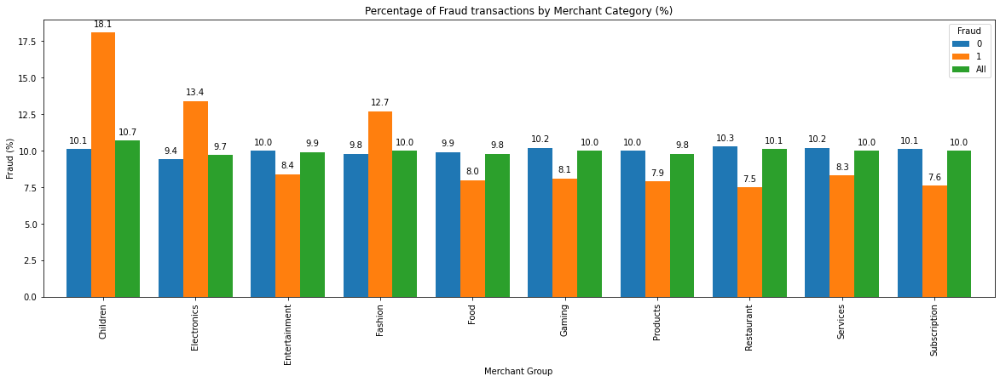

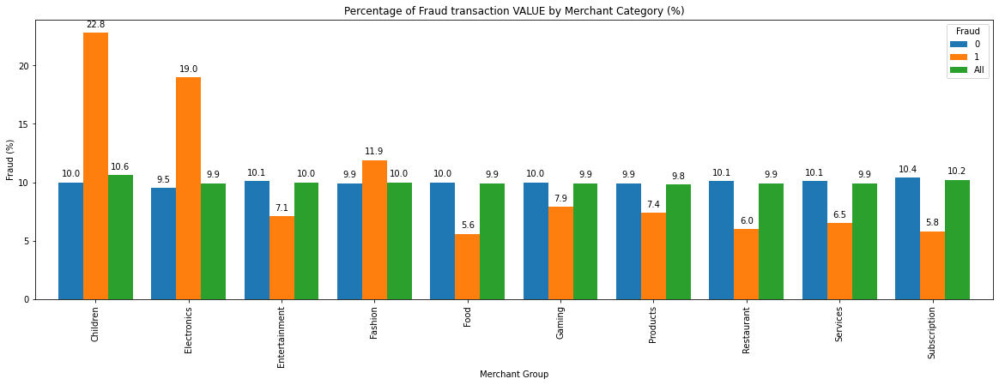

In [ ]:
# Create additional crosstab showing fraud volume and value
ct2_61a = round(pd.crosstab(index=df2_train["Merchant Group"], columns=df2_train["Fraud"], values=df2_train.index, aggfunc='count', 
                               normalize='columns', margins=True),3)*100

# Create bar chart from crosstab
bar2_61a = ct2_61a.plot(kind='bar', xlabel='Merchant Group', ylabel='Fraud (%)',
                              title="Percentage of Fraud transactions by Merchant Category (%)", width=0.8, figsize=(20,6))
# Annotate the chart with values
for p in bar2_61a.patches:
    bar2_61a.annotate(s=round(p.get_height(), 3),
                xy=(p.get_x()+p.get_width()/2., p.get_height()),
                ha='center',
                va='center',
                xytext=(0, 10),
                textcoords='offset points')
plt.show;

ct2_61b = round(pd.crosstab(index=df2_train["Merchant Group"], columns=df2_train["Fraud"], values=df2_train["Amount"], aggfunc='sum', 
                               normalize='columns', margins=True),3)*100


# Create bar chart from crosstab
bar2_61b = ct2_61b.plot(kind='bar', xlabel='Merchant Group', ylabel='Fraud (%)',
                              title="Percentage of Fraud transaction VALUE by Merchant Category (%)", width=0.8, figsize=(20,6))
# Annotate the chart with values
for p in bar2_61b.patches:
    bar2_61b.annotate(s=round(p.get_height(), 3),
                xy=(p.get_x()+p.get_width()/2., p.get_height()),
                ha='center',
                va='center',
                xytext=(0, 10),
                textcoords='offset points')
plt.show;


### 2.7: Save output with new feature variables for next step

In [ ]:
# Validate columns in df1 dataset
print(df2_train.columns)
# Save dataset while keeping original columns
df2_train.to_csv('CreditCardDataFinalCleanFeatures.csv', mode='w', index=True)

# Download dataset and upload to Github profile. This can then be used to continute script from step 3, rather than run step 1+2 each time.
from google.colab import files
files.download('CreditCardDataFinalCleanFeatures.csv')

Index(['Date', 'Day of Week', 'Time', 'Type of Card', 'Entry Mode', 'Amount',
       'Type of Transaction', 'Merchant Group', 'Country of Transaction',
       'Shipping Address', 'Country of Residence', 'Gender', 'Age', 'Bank',
       'Fraud', 'TxnID_Dup', 'Type Entry', 'Ship_Txn_Same', 'Ship_Res_Same',
       'Res_Txn_Same'],
      dtype='object')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

#<font color='Orange'> 3: Data pre-processing and correlation analysis </font>


In [78]:
import numpy as np
import pandas as pd
from pandas_profiling import ProfileReport
import matplotlib.pyplot as plt #Import matplotlib to show some variable comparisons
%matplotlib inline

In [79]:
# Read in cleansed dataset with new features and set index
df3_train = pd.read_csv('https://raw.githubusercontent.com/boxfather78/MaV/main/CreditCardDataFinalCleanFeatures.csv') # For final version, amend to downloaded version
df3_train.set_index(df3_train.columns[0], drop=True, inplace=True)
df3_train.index.name = "Index"

### 3.1: Explore Correlations
The correlation matrix in the profile report in section 2.1 suggests some strong correlations with Fraud in the Phi-K matrix, a correlation coefficient that works well on categorical data as well as numeric, while exploring non-linear relationships [citation](https://arxiv.org/abs/1811.11440). Output values are between 0 and 1, with 0 indicating no relationship, and 1 a direct relationship.

We first replicate the table in Seaborn with our new feature variables and then commentate below.

interval columns not set, guessing: ['Time', 'Amount', 'Age', 'Fraud', 'TxnID_Dup', 'Ship_Txn_Same', 'Ship_Res_Same', 'Res_Txn_Same']


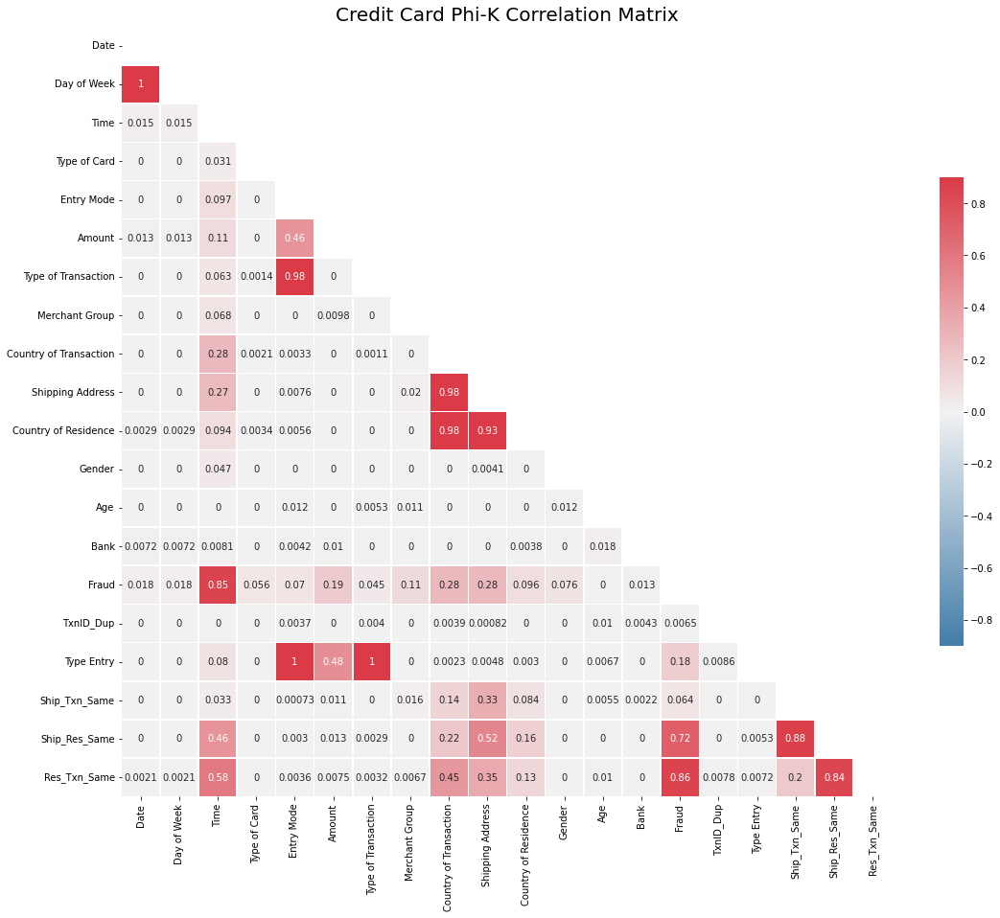

In [ ]:
!pip install phik
import seaborn as sns # Import seaborn to create heatmap
import phik
from phik import report

# Use Phi-K and seaborn to create full correlation matrix and a half-heatmap.
corr1 = df3_train.phik_matrix()

# Set up the  figure - large to enable values to be shown
f, ax = plt.subplots(figsize=(18, 18))
plt.title('Credit Card Phi-K Correlation Matrix', fontsize = 20) # title with fontsize 20

# Generate a mask for the upper triangle using triu (replacing with ones)
mask = np.triu(np.ones_like(corr1, dtype=bool))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(240, 10, n=9, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr1, mask=mask, vmin=-0.9, vmax=0.9, cmap=cmap, center=0,
            square=True, linewidths=.5, annot=True, cbar_kws={"shrink": 0.5})
plt.show()

3.1.1: **Correlations Commentary**

The primary correlations with Fraud are (by order of magnitude):
- <font color='Blue'>Res_Txn_Same </font>
- Time
- <font color='Blue'>Ship_Res_Same </font>
- Country of Transaction
- Shipping Address
- Amount
- <font color='Blue'>Type_Entry </font>

There is also some lower-level correlation between Fraud and...
- Merchant Group
- Country of Residence
- Gender
- Entry Mode

This shows that the new features created <font color='Blue'>(highlighted)</font> outperform the existing ones

There is multicollinearity between:
- Day of Week vs. Date (We would expect this - solution: Drop Day of Week from dataset)
- Amount vs. Entry Mode (We would expect this as we know some types of entry modes enforce payment limits)
- Type of Transaction vs. Entry Mode (Expected, as we know entry Modes have dependency on Type of Transaction)
- Shipping Address vs. Country of Transaction (Expected multicollinearity since most people will have goods delivered to address where they are)
- Country of Residence vs. Shipping Address/Country of Transaction (Again, expected correlation as customer likely to reside in same country as transaction and where goods will be sent)
- Time vs. Country of Transaction/Shipping Address and our new features (Could purely be a function of timezones in which purchases are made)


**Ethical Considerations**

Based on regulatory framework and the risk of model bias, I would not include Gender in my model at all, despite a low correlation, as this would risk detrimental transaction experiences based on customer gender - and we do not want our model to discriminate by gender.

### 3.2: ENCODE categorical variables
Encoding is required to cater for the string data that machine learning algorithms may struggle to interpret - effectively providing each distinct string value with a numeric value. While Tree-based models will deal well with categorical data, linear or neural network types of model will not. [citation](https://datascience.stackexchange.com/questions/9443/when-to-use-one-hot-encoding-vs-labelencoder-vs-dictvectorizor) [citation2](https://stackoverflow.com/questions/61217713/labelencoder-for-categorical-features/61217936#61217936)

As our string data is categorical, rather than ordinal, One Hot Encoding may be more effective than Label Encoder, which will automatically apply an order to the data. One Hot Encoding splits each array variable into a series of binary variables, though this creates a large number of features that may lack relevance, increasing the dimensionality of any model. 

High dimensionality can cause overfitting of a model (citation), but can be addressed later through variable reduction techniques like Principle Component (PCA) or Factor Analysis, or in our case we will use a manual selection of features based on output from the correlation matrix. [citation](https://www.atoti.io/articles/when-to-perform-a-feature-scaling/)

For numeric variables, scaling the data will help models to manage variables with large ranges (e.g. Amount/Age), to ensure each variable has an equal chance to feature in a distance-based classifier (e.g. KNearest Neighbour) ensuring that the importance of the variable isn't increased artificially due to magnitude of values. 

We will encode the data according to the type of column. One Hot Encoding for object/categorical columns and Min/Max for Numeric columns, which will normalise the numeric data to a value between 0 and 1 using the formula below.

$x'=\frac{x-min(x)}{max(x)-min(x)}$

Encoding the data will also support a more conventional Pearson correlation analysis.

In [80]:
# Check variable types in dataset
print(df3_train.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 79987 entries, 74551 to 40477
Data columns (total 20 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Date                    79987 non-null  object 
 1   Day of Week             79987 non-null  object 
 2   Time                    79987 non-null  int64  
 3   Type of Card            79987 non-null  object 
 4   Entry Mode              79987 non-null  object 
 5   Amount                  79987 non-null  float64
 6   Type of Transaction     79987 non-null  object 
 7   Merchant Group          79987 non-null  object 
 8   Country of Transaction  79987 non-null  object 
 9   Shipping Address        79987 non-null  object 
 10  Country of Residence    79987 non-null  object 
 11  Gender                  79987 non-null  object 
 12  Age                     79987 non-null  float64
 13  Bank                    79987 non-null  object 
 14  Fraud                   79987 non-

In [81]:
# Define which columns should be encoded
columns_to_encode = df3_train.select_dtypes(include = object).columns.tolist()
print("Columns to encode:", columns_to_encode)

# Create One Hot Encoding using pandas get_dummies
df3_train_OHE = pd.get_dummies(df3_train, columns=columns_to_encode)

# Check completion of encoding
print("\n\n",df3_train_OHE.info(),"\n\n",df3_train_OHE.head())

Columns to encode: ['Date', 'Day of Week', 'Type of Card', 'Entry Mode', 'Type of Transaction', 'Merchant Group', 'Country of Transaction', 'Shipping Address', 'Country of Residence', 'Gender', 'Bank', 'Type Entry']
<class 'pandas.core.frame.DataFrame'>
Int64Index: 79987 entries, 74551 to 40477
Data columns (total 58 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   Time                                   79987 non-null  int64  
 1   Amount                                 79987 non-null  float64
 2   Age                                    79987 non-null  float64
 3   Fraud                                  79987 non-null  int64  
 4   TxnID_Dup                              79987 non-null  int64  
 5   Ship_Txn_Same                          79987 non-null  int64  
 6   Ship_Res_Same                          79987 non-null  int64  
 7   Res_Txn_Same                           79987 non-null 

###3.3: SCALE numeric variables

In [82]:
from sklearn import preprocessing as pp

# Define which columns should be scaled
columns_to_scale  = df3_train_OHE.select_dtypes(include = ['float64','int64'],).columns
print("Columns to scale:", columns_to_scale)

# Initiate Scaler
scaler = pp.MinMaxScaler()

# Create empty list of of columns to scale
label_scalers = {}  

# Cycle through columns to scale and transform existing cols.
for column in columns_to_scale:
    label_scalers[column] = scaler
    df3_train_OHE[columns_to_scale] = scaler.fit_transform(df3_train_OHE[columns_to_scale])
    
# Check completion of scaling/encoding
print("\n\n", df3_train_OHE.info(),"\n\n", df3_train_OHE.head())

Columns to scale: Index(['Time', 'Amount', 'Age', 'Fraud', 'TxnID_Dup', 'Ship_Txn_Same',
       'Ship_Res_Same', 'Res_Txn_Same'],
      dtype='object')
<class 'pandas.core.frame.DataFrame'>
Int64Index: 79987 entries, 74551 to 40477
Data columns (total 58 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   Time                                   79987 non-null  float64
 1   Amount                                 79987 non-null  float64
 2   Age                                    79987 non-null  float64
 3   Fraud                                  79987 non-null  float64
 4   TxnID_Dup                              79987 non-null  float64
 5   Ship_Txn_Same                          79987 non-null  float64
 6   Ship_Res_Same                          79987 non-null  float64
 7   Res_Txn_Same                           79987 non-null  float64
 8   Date_2020-10-13                        79987 non-n

### 3.4: Explore Correlations with additional features
We can now explore the correlations based on categorical data cast as numerics through one-hot encoding. This will be done using a more conventional Pearson coefficient.

In [ ]:
# First we will see which variables carry the highest correlations with Fraud, either positive or negative
correlation1 = abs(df3_train_OHE.corrwith(df3_train_OHE['Fraud'])).sort_values(ascending=False)

print("Correlation Coefficients vs. Fraud:\n", correlation1)

Correlation Coefficients vs. Fraud:
 Fraud                                    1.000000
Res_Txn_Same                             0.654207
Ship_Res_Same                            0.513547
Country of Transaction_United Kingdom    0.345725
Shipping Address_United Kingdom          0.338001
Time                                     0.285289
Country of Transaction_India             0.158432
Country of Transaction_USA               0.155190
Country of Transaction_China             0.149945
Shipping Address_USA                     0.143703
Country of Transaction_Russia            0.142405
Shipping Address_India                   0.140108
Shipping Address_China                   0.138179
Shipping Address_Russia                  0.133778
Country of Residence_United Kingdom      0.117660
Entry Mode_PIN                           0.114512
Amount                                   0.108895
Type Entry_POS-PIN                       0.075219
Entry Mode_CVC                           0.068195
Type Entry_On

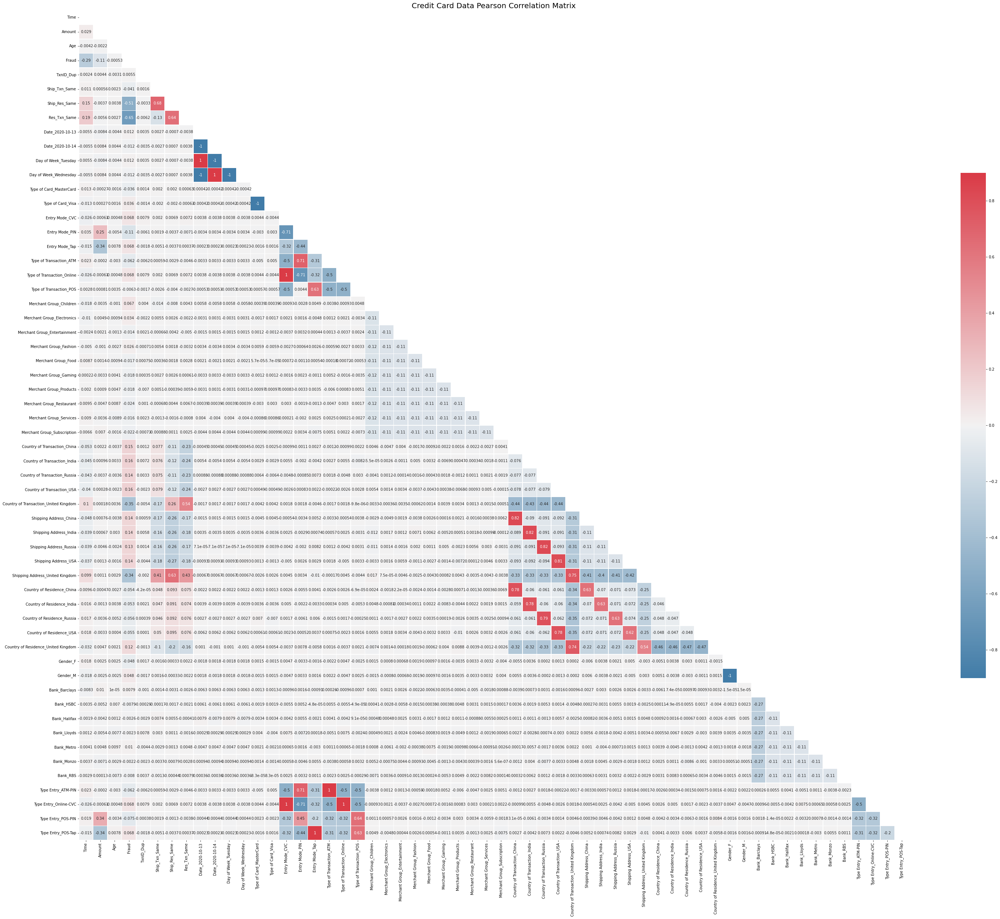

In [ ]:
# Use pandas corr and seaborn to create full correlation matrix and a half-heatmap.
correlation2 = df3_train_OHE.corr(method='pearson')

# Set up the  figure - large to enable values to be shown
f, ax = plt.subplots(figsize=(50, 50))
plt.title('Credit Card Data Pearson Correlation Matrix', fontsize = 20) # title with fontsize 20

# Generate a mask for the upper triangle using triu (replacing with ones)
mask = np.triu(np.ones_like(correlation2, dtype=bool))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(240, 10, n=9, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
image = sns.heatmap(correlation2, mask=mask, vmin=-0.9, vmax=0.9, cmap=cmap, center=0,
            square=True, linewidths=0.5, annot=True, cbar_kws={"shrink": 0.5})
plt.show()
figure = image.get_figure()
figure.savefig('pearson.jpg', dpi=400) # Save image for easier viewing

3.4.1: This correlation matrix is helpful in showing where there is multicollinearity between our new features, many of which are to be expected. This knowledge which will help in reducing the dimensionality of the data in our next steps, alongside correlation with Fraud.

### 3.5: Final Model Feature Variable selection

Based on previous observations, I will drop the following variables from my modelling dataset:

- All 28 variables with correlation below +/-0.05, shown in section 3.4. This includes Gender and Age.
- Due to expected multicollinearity between many of my new features, and existing features which have been one-hot encoded, I will remove all but the ones that provide most predictive power.

Therefore the variables that I will keep in the feature dataset are:
- Res_Txn_Same
- Ship_Res_Same
- Time
- Country of Transaction_United Kingdom
- Shipping Address_United Kingdom
- Country of Residence_United Kingdom
- Entry Mode_PIN
- Entry Mode_CVC
- Entry Mode_Tap
- Merchant Group_Children

### 3.6: Final modelling dataset creation
Create dataframe containing only the variables we will take forward, then re-split into our target and feature variables

In [83]:
df_train_F = pd.DataFrame(df3_train_OHE[['Fraud','Res_Txn_Same','Ship_Res_Same','Time','Country of Transaction_United Kingdom',
                                        'Shipping Address_United Kingdom','Country of Residence_United Kingdom','Entry Mode_PIN',
                                        'Entry Mode_CVC','Entry Mode_Tap','Merchant Group_Children']])
x_train_F = df_train_F.drop(["Fraud"], axis=1)
y_train_F = pd.DataFrame(df_train_F['Fraud'])

print("Merged Training dataset:\n");
print(df_train_F.info())
print("\n\n Feature variable Training dataset:\n");
print(x_train_F.info())
print("\n\n Target variable Training dataset:\n");
print(y_train_F.info())

Merged Training dataset:

<class 'pandas.core.frame.DataFrame'>
Int64Index: 79987 entries, 74551 to 40477
Data columns (total 11 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   Fraud                                  79987 non-null  float64
 1   Res_Txn_Same                           79987 non-null  float64
 2   Ship_Res_Same                          79987 non-null  float64
 3   Time                                   79987 non-null  float64
 4   Country of Transaction_United Kingdom  79987 non-null  uint8  
 5   Shipping Address_United Kingdom        79987 non-null  uint8  
 6   Country of Residence_United Kingdom    79987 non-null  uint8  
 7   Entry Mode_PIN                         79987 non-null  uint8  
 8   Entry Mode_CVC                         79987 non-null  uint8  
 9   Entry Mode_Tap                         79987 non-null  uint8  
 10  Merchant Group_Children                7

In [ ]:
# Save datasets
df_train_F.to_csv('CreditCardData_Train.csv', mode='w', index=True)
x_train_F.to_csv('CreditCardData_xTrain.csv', mode='w', index=True)
y_train_F.to_csv('CreditCardData_yTrain.csv', mode='w', index=True)

# Download dataset and upload to Github profile. This can then be used to continute script from step 4, rather than run step 1+2+3 each time.
from google.colab import files
files.download('CreditCardData_Train.csv')
files.download('CreditCardData_xTrain.csv')
files.download('CreditCardData_yTrain.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### 3.7: Create file pre-processing functions for test dataset and future input files

3.7.1: First create cleansing routine function from stage 1.

In [91]:
def process_file(input):
  """Function takes input file matching the layout of train dataset and processes using same criteria as our train dataset, 
  leaving us with a file matching the format"""
  print("############################# Start of process_file function ###################################\n\n")
  # 1.4: DUPLICATES - Only need to check for Full duplicates, as we didn't end up finding significance in duplicated Txn IDs
  input['Full_duplicate'] = input.duplicated(keep='first')
  print("There are", len(input[(input['Full_duplicate'] == True)]), " full duplicates across the file.") # 0 duplicates in file
  input.drop_duplicates(keep='first', inplace=True)
  # 1.5: COMPLETENESS - Find and remove/infill missing values in the test dataset
  print("There are",sum(input.isnull().any(axis=1)),"rows with at least one missing value\n")
  # Validate which columns have missing values
  print(input.isna().sum(),"\n\n")
  # Replace NaN Amounts with £0 first, ahead of reformatting
  input["Amount"] = input["Amount"].replace(np.nan, "£0", regex=True) # Previously done in section 1.7
  # Recode Amount first, then amend following statement to remove all further records with a NaN
  input.dropna(how='any', axis=0, inplace=True)
  # 1.6: CONFORMITY - # Replace £ signs and convert Amount to a float
  input["Amount"] = input["Amount"].replace('£', '', regex=True)
  input = input.astype({"Amount": 'float'})
  # Convert Object variables into Categorical
  input = input.astype({"Day of Week": 'category',"Type of Card": 'category',"Entry Mode":'category',"Type of Transaction":'category',
                  "Merchant Group":'category',"Country of Transaction":'category',"Shipping Address":'category',
                  "Country of Residence":'category',"Bank":'category',"Gender":'category'})
  # Convert Date into Datetime variable
  input["Date"] = pd.to_datetime(input["Date"])
  # 1.7: INTEGRITY - # DATA CLEANSE - carry out changes on test dataset
  # Date - not significant and not used as final modelling var. We previously removed 15/16th Oct but any new dataset is likely to contain new dates so we won't remove 
  # Time - replace 24 with 0
  input["Time"] = input["Time"].replace(24, 0, regex=True)
  # Age - No treatment required, but we will remove the variable that was created for validation
  # Day of Week - Not used as final modelling var, so don't replace incorrect Days of Week
  # Bank - Amend 'Barlcays' to 'Barclays'
  input["Bank"] = input["Bank"].replace('Barlcays', 'Barclays', regex=True)
  print(input.info())
  process_file_out = input
  print("############################# End of process_file function ###################################\n\n")
  return process_file_out

3.7.2: Then create function to add the useful new features

In [92]:
def add_features(process_file_out):
  """Function takes cleansed input file from output of process_file function and creates features using same criteria as our train dataset, 
  leaving us with a file matching the layout"""
  print("############################# Start of add_features function ###################################\n\n")
  # 2.1 Drop unnecessary vars
  process_file_out = process_file_out.drop(['Transaction ID','Full_duplicate'], axis=1)
  # 2.3: Won't create Type Entry Var as it didn't make funal cut of modelling vars in training dataset
  # 2.5: Create feature variables for Shipping Address, Country of Transaction and Country of Residence to show where these differ.
  # Won't create for Ship_Res_Same as not used in final model vars
  process_file_out["Ship_Res_Same"] = np.where(process_file_out["Shipping Address"] == process_file_out["Country of Residence"], 1, 0)
  process_file_out["Res_Txn_Same"] = np.where(process_file_out["Country of Residence"] == process_file_out["Country of Transaction"], 1, 0)
  print(process_file_out.info())
  print("############################# End of add_features function ###################################\n\n")
  add_features_out = process_file_out
  return add_features_out

3.7.3: Finally, create function to encode and scale variables for modelling

In [93]:
def scale_encode(add_features_out):
  """Function takes cleansed input file with additional features from output of add_features function and encodes/scales 
  using same criteria as our train dataset, then selects final variables, leaving us with a test dataset"""
  print("############################# Start of scale_encode function ###################################\n\n")
  # 3.2: ENCODING
  # Define which columns should be encoded
  columns_to_encode = add_features_out.select_dtypes(include='category').columns.tolist()
  print("Columns to encode:", columns_to_encode)
  # Create One Hot Encoding using pandas get_dummies
  add_features_out_OHE = pd.get_dummies(add_features_out, columns=columns_to_encode)
  # Check completion of encoding
  print("View of encoding features: \n\n",add_features_out_OHE.info(),"\n\n",add_features_out_OHE.head())
  # 3.3: SCALING
  from sklearn import preprocessing as pp
  # Define which columns should be scaled
  columns_to_scale  = add_features_out_OHE.select_dtypes(include = ['float64','int64'],).columns
  print("Columns to scale:", columns_to_scale,"\n")
  # Initiate Scaler
  scaler = pp.MinMaxScaler()
  # Create empty list of of columns to scale
  label_scalers = {}  
  # Cycle through columns to scale and transform existing cols.
  for column in columns_to_scale:
    label_scalers[column] = scaler
    add_features_out_OHE[columns_to_scale] = scaler.fit_transform(add_features_out_OHE[columns_to_scale])
  # Check completion of scaling
  print("View of encoded and scaled features: \n\n", add_features_out_OHE.info(),"\n\n", add_features_out_OHE.head())
  # 3.6: Final selections - make available globally (i.e. outside function)
  global df_test_F
  global x_test_F
  global y_test_F
  df_test_F = pd.DataFrame(add_features_out_OHE[['Fraud','Res_Txn_Same','Ship_Res_Same','Time','Country of Transaction_United Kingdom',
                                        'Shipping Address_United Kingdom','Country of Residence_United Kingdom','Entry Mode_PIN',
                                        'Entry Mode_CVC','Entry Mode_Tap','Merchant Group_Children']])
  x_test_F = df_test_F.drop(["Fraud"], axis=1)
  y_test_F = pd.DataFrame(df_test_F['Fraud'])

  print("Merged Test dataset:\n");
  print(df_test_F.info())
  print("\n\n Feature variable Test dataset:\n");
  print(x_test_F.info())
  print("\n\n Target variable Test dataset:\n");
  print(y_test_F.info())
  print("############################# End of scale_encode function ###################################\n\n")
  return df_test_F, x_test_F, y_test_F

### 3.8: Initiate Functions to create final test datasets

In [94]:
input = df1_test
process_file_out = process_file(input)
add_features_out = add_features(process_file_out)

scale_encode(add_features_out)


############################# Start of process_file function ###################################


There are 0  full duplicates across the file.
There are 7 rows with at least one missing value

Transaction ID            0
Date                      0
Day of Week               0
Time                      0
Type of Card              0
Entry Mode                0
Amount                    1
Type of Transaction       0
Merchant Group            3
Country of Transaction    0
Shipping Address          3
Country of Residence      0
Gender                    1
Age                       0
Bank                      0
Fraud                     0
Full_duplicate            0
dtype: int64 


<class 'pandas.core.frame.DataFrame'>
Int64Index: 19994 entries, 65440 to 22149
Data columns (total 17 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   Transaction ID          19994 non-null  object        
 1   Date           

(       Fraud  Res_Txn_Same  Ship_Res_Same      Time  \
 65440    0.0           1.0            0.0  0.739130   
 65326    0.0           0.0            0.0  0.695652   
 10802    0.0           1.0            0.0  0.739130   
 79211    0.0           1.0            1.0  0.304348   
 99027    0.0           1.0            0.0  0.565217   
 ...      ...           ...            ...       ...   
 14782    0.0           1.0            1.0  0.695652   
 64241    0.0           1.0            1.0  0.478261   
 7211     1.0           0.0            0.0  0.260870   
 25468    0.0           0.0            0.0  0.521739   
 22149    0.0           1.0            1.0  0.391304   
 
        Country of Transaction_United Kingdom  Shipping Address_United Kingdom  \
 65440                                      1                                0   
 65326                                      0                                0   
 10802                                      1                                0  

In [96]:
# Save datasets
df_test_F.to_csv('CreditCardData_Test.csv', mode='w', index=True)
x_test_F.to_csv('CreditCardData_xTest.csv', mode='w', index=True)
y_test_F.to_csv('CreditCardData_yTest.csv', mode='w', index=True)

# Download dataset and upload to Github profile. This can then be used to continute script from step 4, rather than run step 1+2+3 each time.
from google.colab import files
files.download('CreditCardData_Test.csv')
files.download('CreditCardData_xTest.csv')
files.download('CreditCardData_yTest.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# <font color='Orange'> 4: Model creation and commentary </font>

This section uses the SciKitLearn code library, from where we will import useful modules.

### 4.1: Initiate Train and Test datasets

Here we bring in the datasets already created in section 3.






In [102]:
import numpy as np
import pandas as pd
# These steps are necessary if you are starting from section 4.
x_train_F = pd.read_csv('https://raw.githubusercontent.com/boxfather78/MaV/main/CreditCardData_xTrain.csv') # For final version, amend to downloaded version
x_train_F.set_index(x_train_F.columns[0], drop=True, inplace=True)
x_train_F.index.name = "Index"

y_train_F = pd.read_csv('https://raw.githubusercontent.com/boxfather78/MaV/main/CreditCardData_yTrain.csv') # For final version, amend to downloaded version
y_train_F.set_index(y_train_F.columns[0], drop=True, inplace=True)
y_train_F.index.name = "Index"

x_test_F = pd.read_csv('https://raw.githubusercontent.com/boxfather78/MaV/main/CreditCardData_xTest.csv') # For final version, amend to downloaded version
x_test_F.set_index(x_test_F.columns[0], drop=True, inplace=True)
x_test_F.index.name = "Index"

y_test_F = pd.read_csv('https://raw.githubusercontent.com/boxfather78/MaV/main/CreditCardData_yTest.csv') # For final version, amend to downloaded version
y_test_F.set_index(y_test_F.columns[0], drop=True, inplace=True)
y_test_F.index.name = "Index"

# Start from here without re-defining variables if you are running the script all in one go.
print("Training dataset predictor variables: \n")
print(x_train_F.info(), "\n")
print("Training dataset target variable: \n")
print(y_train_F.info(), "\n")
print("Test dataset predictor variables: \n")
print(x_test_F.info(), "\n")
print("Test dataset target variable: \n")
print(y_test_F.info(), "\n")

Training dataset predictor variables: 

<class 'pandas.core.frame.DataFrame'>
Int64Index: 79987 entries, 74551 to 40477
Data columns (total 10 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   Res_Txn_Same                           79987 non-null  float64
 1   Ship_Res_Same                          79987 non-null  float64
 2   Time                                   79987 non-null  float64
 3   Country of Transaction_United Kingdom  79987 non-null  int64  
 4   Shipping Address_United Kingdom        79987 non-null  int64  
 5   Country of Residence_United Kingdom    79987 non-null  int64  
 6   Entry Mode_PIN                         79987 non-null  int64  
 7   Entry Mode_CVC                         79987 non-null  int64  
 8   Entry Mode_Tap                         79987 non-null  int64  
 9   Merchant Group_Children                79987 non-null  int64  
dtypes: float64(3), int64(7)
me

### 4.2: Create classifications using training data
This will use default settings of 5 models to be built using scikit learn library.

In [ ]:
# Import Scikit Learn libraries for the classifications we'll build
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression

#Fit and predict each model type based on default settings
dt = DecisionTreeClassifier()
dt.fit(x_train_F,y_train_F)
dt_pred = dt.predict(x_test_F)

knn = KNeighborsClassifier()
knn.fit(x_train_F, y_train_F)
knn_pred = knn.predict(x_test_F)

rf = RandomForestClassifier()
rf.fit(x_train_F, y_train_F)
rf_pred = rf.predict(x_test_F)

gb = GradientBoostingClassifier()
gb.fit(x_train_F, y_train_F)
gb_pred = gb.predict(x_test_F)

log = LogisticRegression()
log.fit(x_train_F, y_train_F)
log_pred = log.predict(x_test_F)

### 4.3: View Classification report
This is to see effectiveness metrics for each classifier vs. test dataset.

* TP = True Positive
* TN = True Negative
* FP = False Positive
* FN = False Negative

While Accuracy is a good measure, approving a loan incorrectly is worse than NOT approving a loan we should have done, due to cost of loan default, so it's important to understand precision and recall. F1 score can analyse as one outcome.

$Accuracy = \frac{TP+TN}{TP+FP+FN+TN}$ - For all labelled as approved, how many were actually approved?

$Precision = \frac{TP}{TP+FP}$ - For all loans labelled as approved, how many were actually approved?

$Recall = \frac{TP}{TP+FN}$ - For all approved loans, how many did we label correctly?

$F1 Score = \frac {TP}{TP+\frac{1}{2}(FP+FN)}$ - Weighted average of Precision & Recall


In [ ]:
# Need to create classification matrix as well...
from sklearn.metrics import classification_report

# Check measures against each model prediction
print("Decision Tree: \n",classification_report(y_test_F, dt_pred))
print("K-Nearest Neighbour: \n",classification_report(y_test_F, knn_pred))
print("Random Forest: \n",classification_report(y_test_F, rf_pred))
print("Gradient Boosting: \n",classification_report(y_test_F, gb_pred))
print("Logistic Regression: \n",classification_report(y_test_F, log_pred))

Decision Tree: 
               precision    recall  f1-score   support

           N       0.57      0.39      0.46        98
           Y       0.75      0.86      0.80       209

    accuracy                           0.71       307
   macro avg       0.66      0.62      0.63       307
weighted avg       0.69      0.71      0.69       307

K-Nearest Neighbour: 
               precision    recall  f1-score   support

           N       0.71      0.38      0.49        98
           Y       0.76      0.93      0.84       209

    accuracy                           0.75       307
   macro avg       0.74      0.65      0.66       307
weighted avg       0.75      0.75      0.73       307

Random Forest: 
               precision    recall  f1-score   support

           N       0.67      0.39      0.49        98
           Y       0.76      0.91      0.83       209

    accuracy                           0.74       307
   macro avg       0.71      0.65      0.66       307
weighted avg     

### 4.4: Initial Output Evaluations

The confusion matrix shows 187 of 209 approved loans and 48 out of 98 declined loans predicted correctly - our best result from all default models.

Coefficients in the model show the influence that each variable has on the outcome. Credit_History has an overwhelming influence, in line with observations on the correlation plot.

NB: My best model was chosen based on scikit learn default settings, but it's recommended to adjust model settings or feature variables for each type of model to achieve optimal outcomes.



### 4.5: Model Tuning

# <font color='Orange'> 5: Model Validation and Evaluation </font>
To include creation of a table to stoer accuracy metrics.

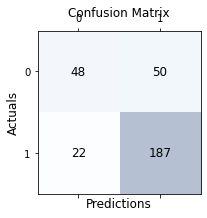

                0  Coefficients
5  Credit_History      1.985997
1         Married      0.431581
0          Gender      0.335669
3        Graduate      0.197545
6   Property_Area      0.112889
4   Self_Employed     -0.081860
2      Dependents     -0.060026


In [ ]:
from sklearn.metrics import confusion_matrix

# Calculate the confusion matrix
conf_matrix = confusion_matrix(y_test, log_pred)

# Print the confusion matrix using Matplotlib
fig, ax = plt.subplots(figsize=(3, 3))
ax.matshow(conf_matrix, cmap=plt.cm.Blues, alpha=0.3)
for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        ax.text(x=j, y=i,s=conf_matrix[i, j], va='center', ha='center', size='large')
 
plt.xlabel('Predictions', fontsize=12)
plt.ylabel('Actuals', fontsize=12)
plt.title('Confusion Matrix', fontsize=12)
plt.show()

# Create dataframe to show table of coefficients in order of influence
coef_table = pd.DataFrame(list(x.columns)).copy()
coef_table.insert(len(coef_table.columns),'Coefficients',log.coef_.transpose())
print(coef_table.sort_values(by='Coefficients', ascending=False, key=abs))

### D8: Predict outcomes for logistic regression with new data.

Create array of new values to score, predict outcome, then create dataframe with predictions for all models appended.


# <font color='orange'> 6: Model Illustrations</font>

In [ ]:
new_applicants = {'Gender': [0,1,1,1,0],
                  'Married': [0,1,0,1,1],
                  'Dependents': [0,0.33,0.66,0,1],
                  'Graduate': [1,0,0,1,1],
                  'Self-Employed': [1,0,0,0,1],
                  'Credit_History': [1,0,0,0,1],
                  'Property_Area': [0,0.5,0,1,0.5]
                  }
df_new = pd.DataFrame(new_applicants,columns= ['Gender', 'Married','Dependents','Graduate','Self-Employed','Credit_History','Property_Area'])
log_pred2 = log.predict(df_new)
# We can also see if other models may have predicted differently
dt_pred2 = dt.predict(df_new)
knn_pred2 = knn.predict(df_new)
rf_pred2 = rf.predict(df_new)
gb_pred2 = gb.predict(df_new)

# Append outcomes to dataframe
df_new['log_prediction'] = log_pred2
df_new['dt_prediction'] = dt_pred2
df_new['knn_prediction'] = knn_pred2
df_new['rf_prediction'] = rf_pred2
df_new['gb_prediction'] = gb_pred2
df_new



/usr/local/lib/python3.7/dist-packages/sklearn/base.py:439: UserWarning: X has feature names, but LogisticRegression was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"
/usr/local/lib/python3.7/dist-packages/sklearn/base.py:439: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"
/usr/local/lib/python3.7/dist-packages/sklearn/base.py:439: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"
/usr/local/lib/python3.7/dist-packages/sklearn/base.py:439: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"
/usr/local/lib/python3.7/dist-packages/sklearn/base.py:439: UserWarning: X has feature nam

,Gender,Married,Dependents,Graduate,Self-Employed,Credit_History,Property_Area,log_prediction,dt_prediction,knn_prediction,rf_prediction,gb_prediction
0,0,0,0.00,1,1,1,0.0,Y,N,N,N,Y
1,1,1,0.33,0,0,0,0.5,N,Y,Y,Y,Y
2,1,0,0.66,0,0,0,0.0,N,Y,Y,N,Y
3,1,1,0.00,1,0,0,1.0,N,Y,Y,Y,N
4,0,1,1.00,1,1,1,0.5,Y,N,Y,Y,Y


# <font color='orange'> 7: Back Matter</font>

### 7.1: References

### 7.2: Appendix